<a href="https://colab.research.google.com/github/JoeJoe1313/UDA/blob/main/train_test_1gb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Dec 31 19:16:18 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              43W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

# Download Full Data from Kaggle

In [ ]:
# upload kaggle tokens
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"joanalevtcheva","key":"05ead07347beeb99096ef910c342dd11"}'}

In [ ]:
# set up kaggle API credentials
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
# download kaggle dataset
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation

100% 711M/714M [00:32<00:00, 22.9MB/s]
100% 714M/714M [00:32<00:00, 23.2MB/s]


In [ ]:
# unzip dataset
!unzip -q lgg-mri-segmentation.zip

In [ ]:
# delete zip file
!rm lgg-mri-segmentation.zip
# delete repeating directory kaggle_3m
!rm -r kaggle_3m

# Clone Project GitHub Repository

In [ ]:
# clone project repository
!git clone https://github.com/JoeJoe1313/UDA.git

Cloning into 'UDA'...
remote: Enumerating objects: 596, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 596 (delta 7), reused 16 (delta 4), pack-reused 572
Receiving objects: 100% (596/596), 70.58 MiB | 12.18 MiB/s, done.
Resolving deltas: 100% (184/184), done.


In [ ]:
# remove github subset data
!rm -r ./UDA/lgg-mri-segmentation
# move full kaggle data to UDA
!mv ./lgg-mri-segmentation ./UDA/

In [ ]:
# change working directory
%cd /content/UDA/

/content/UDA


# Train, Validation and Testing of the Model

In [ ]:
%run train_model.py

Train dataset shape (2769, 2) with 79 unique patients.
Validation dataset shape (756, 2) with 20 unique patients.
Test dataset shape: (404, 2) with 11 unique patients.


100%|██████████| 94/94 [43:07<00:00, 27.52s/it]


In [ ]:
%run process_models.py

100%|██████████| 94/94 [00:12<00:00,  7.49it/s]


In [ ]:
%run test_model.py

Best epoch is 66
Test Loss: 0.006856002450849001, Test IoU: 0.8492294183144202


# Results Visualisations and Predictions

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import torch
import torch.optim as optim
from PIL import Image

from constants import ModelConstants
from unet import UNet
from utils import diagnosis, predict_mask, print_res

In [ ]:
results

,training_loss,training_iou,validation_loss,validation_iou
epoch,,,,
0,0.186019,0.633743,0.094167,0.699397
1,0.057537,0.726999,0.058310,0.610757
2,0.032846,0.743267,0.035012,0.701781
3,0.026119,0.742970,0.030226,0.698256
4,0.021243,0.747479,0.029459,0.714019
...,...,...,...,...
89,0.002489,0.948127,0.026209,0.820078
90,0.002365,0.950110,0.023716,0.823015
91,0.002311,0.951499,0.027559,0.810193


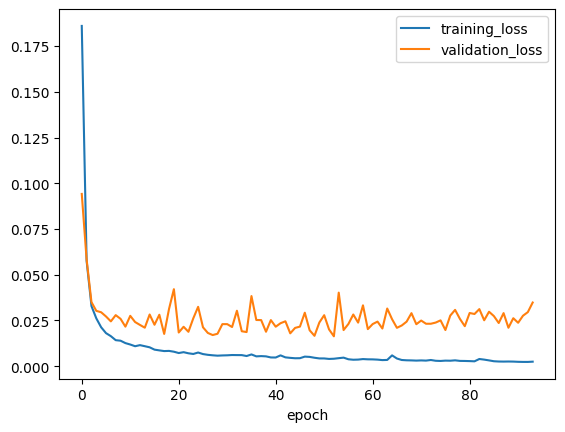

In [ ]:
results[["training_loss", "validation_loss"]].plot()
plt.show()

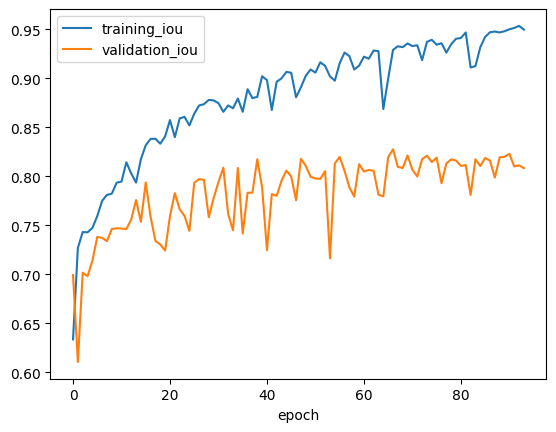

In [ ]:
results[["training_iou", "validation_iou"]].plot()
plt.show()

In [ ]:
df_test["tumor"] = df_test["mask_path"].apply(lambda m: diagnosis(m))
tumors = df_test[df_test["tumor"] == True]
no_tumors = df_test[df_test["tumor"] == False]

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNet(ModelConstants.N_CHANNELS, ModelConstants.N_CLASSES)
model.to(device)
checkpoint = torch.load(model_path)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

UNet(
  (inc): DoubleConv(
    (double_conv): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (down1): Down(
    (maxpool_conv): Sequential(
      (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (1): DoubleConv(
        (double_conv): Sequential(
          (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU(inplace=True)
          (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): BatchNorm2d(128, eps=1e-05, moment

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_20.tif


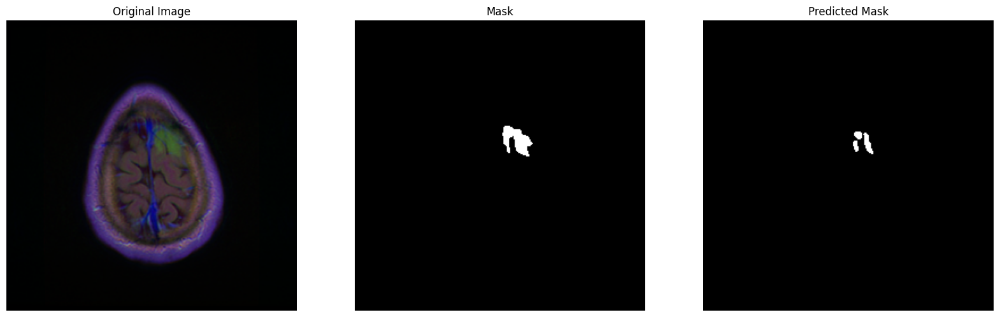

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_16.tif


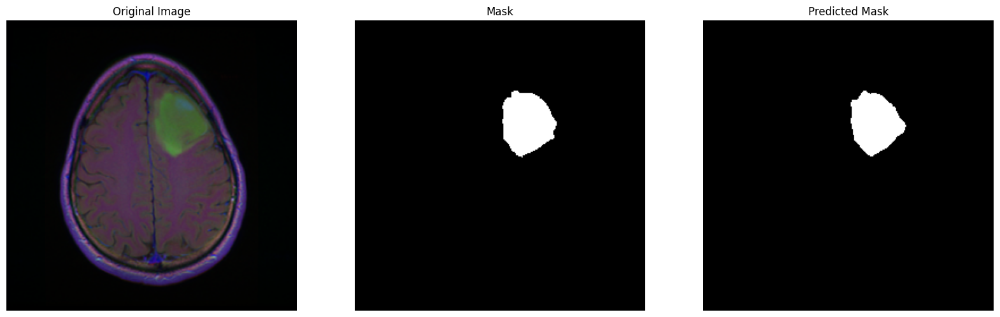

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_17.tif


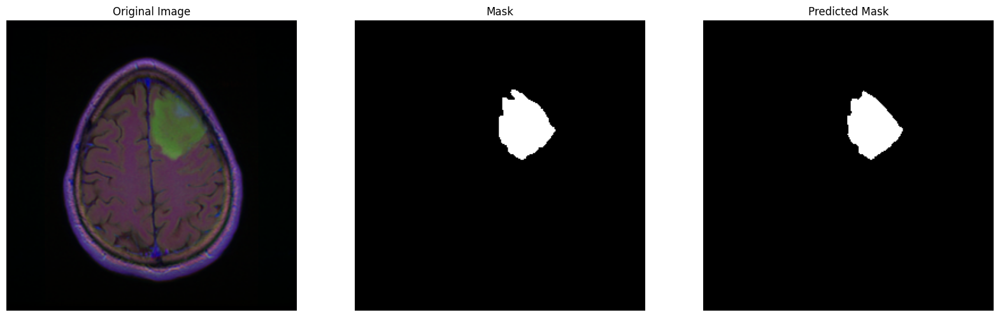

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_18.tif


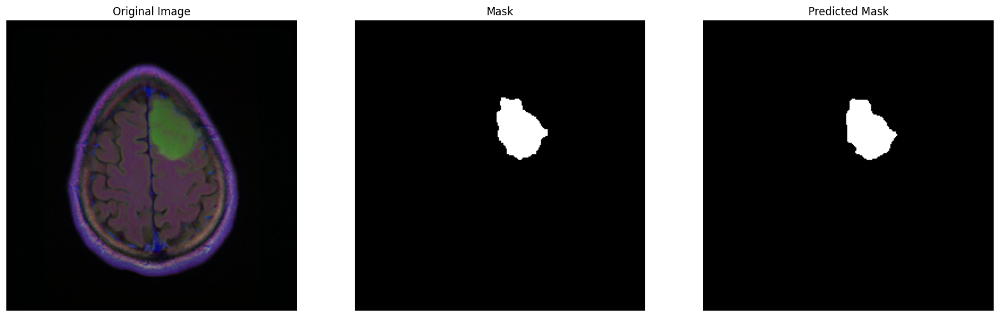

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_14.tif


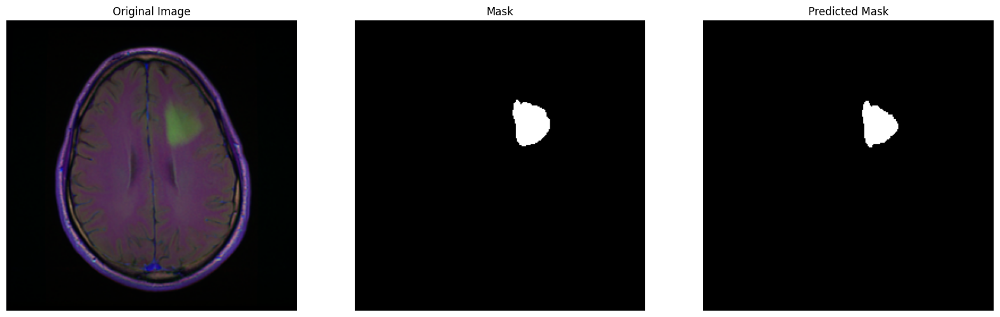

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_19.tif


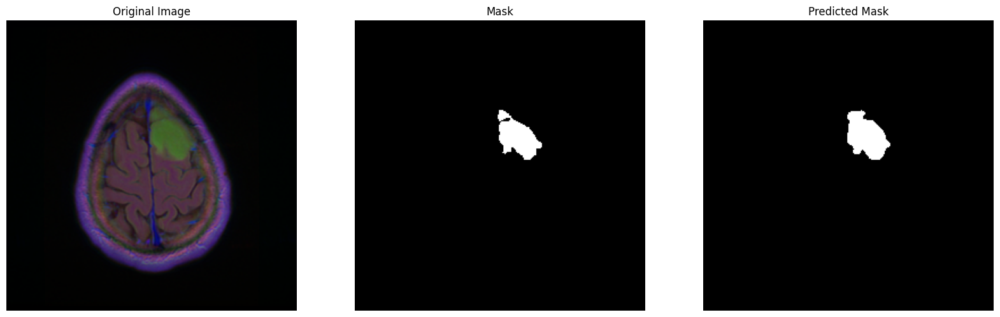

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_15.tif


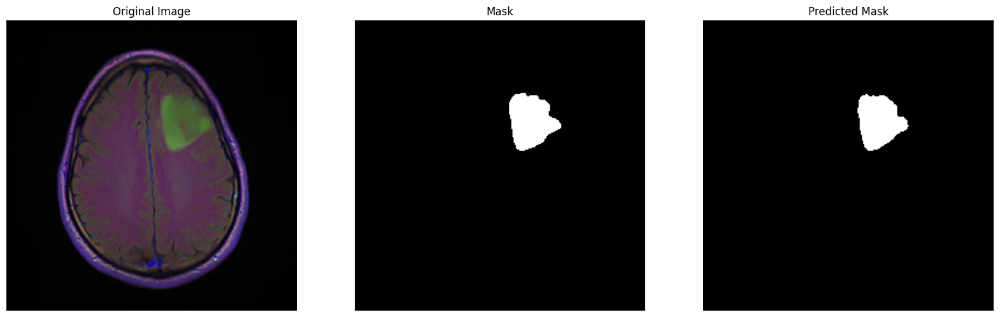

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_19.tif


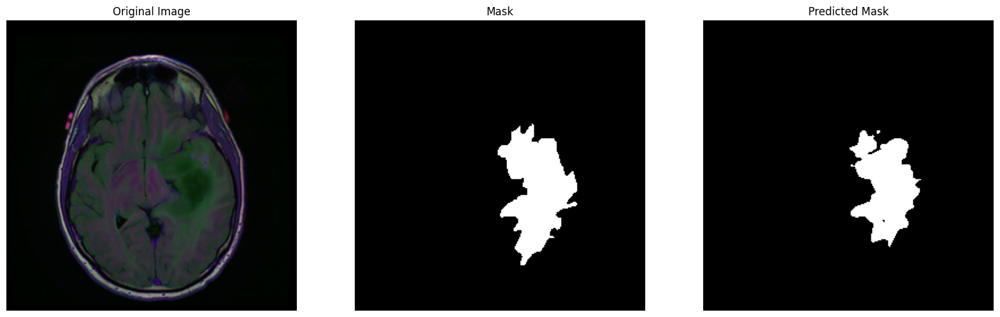

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_16.tif


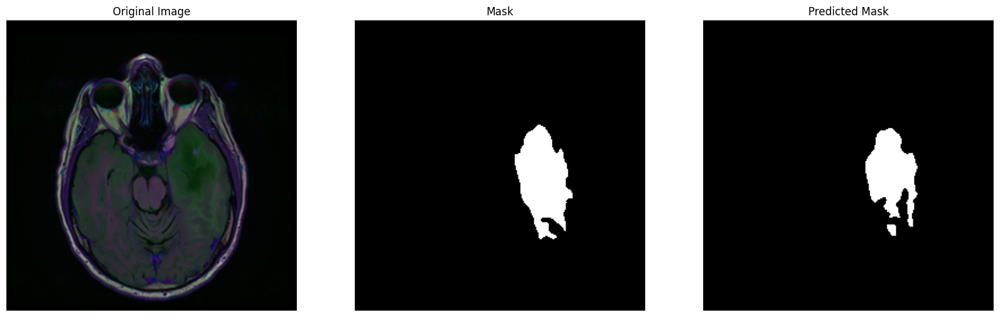

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_17.tif


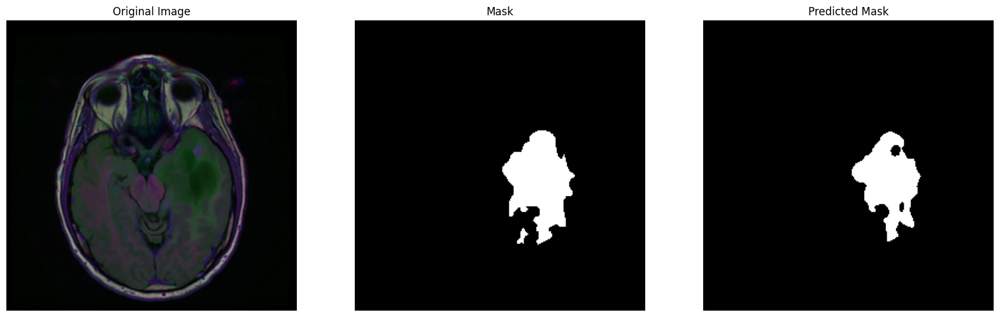

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_13.tif


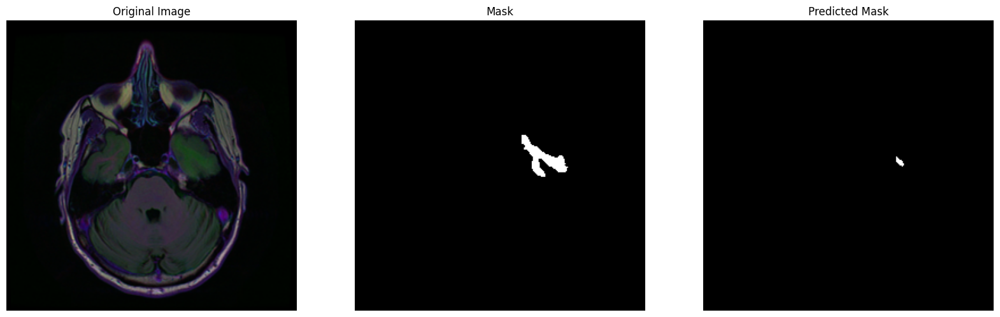

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_18.tif


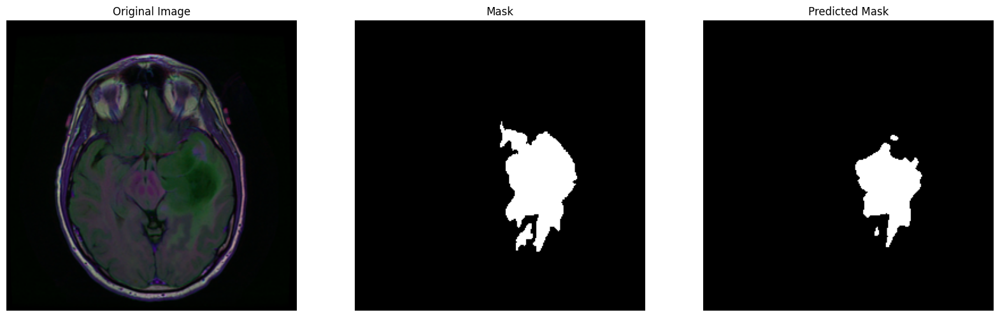

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_15.tif


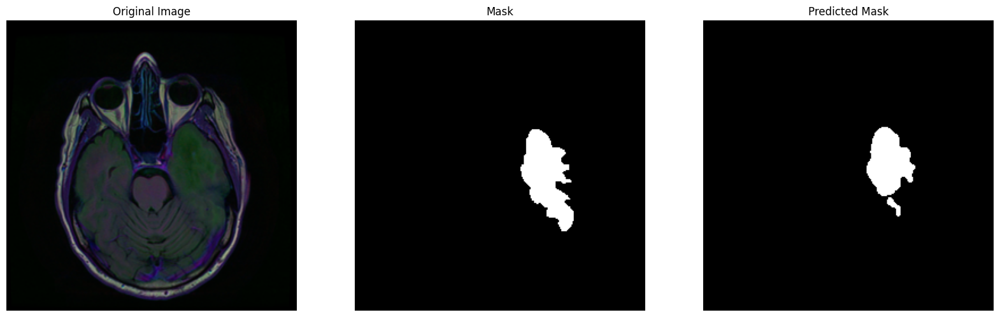

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_26.tif


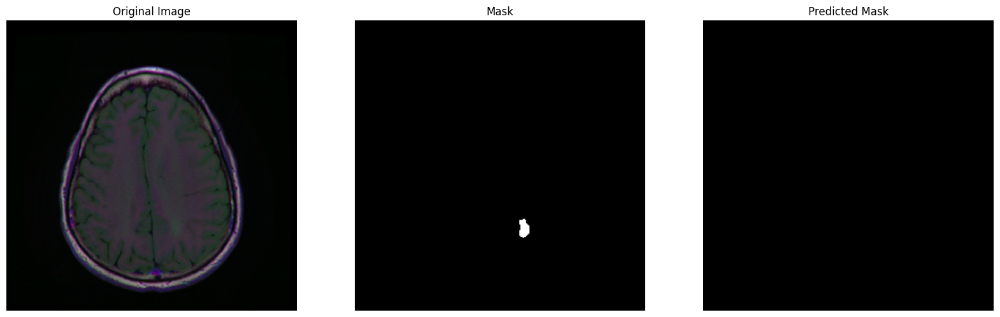

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_25.tif


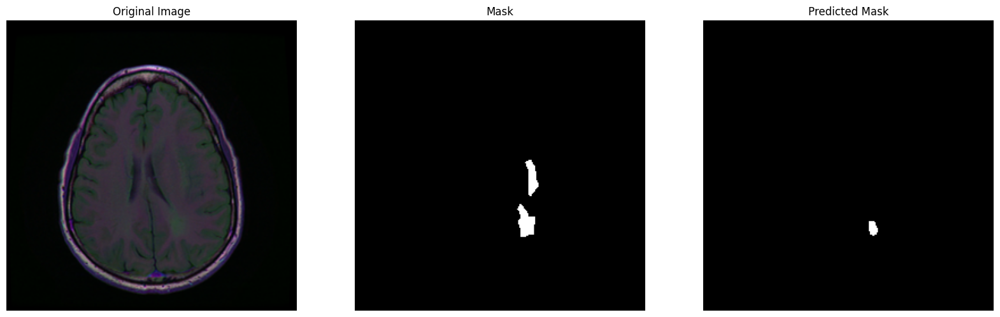

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_24.tif


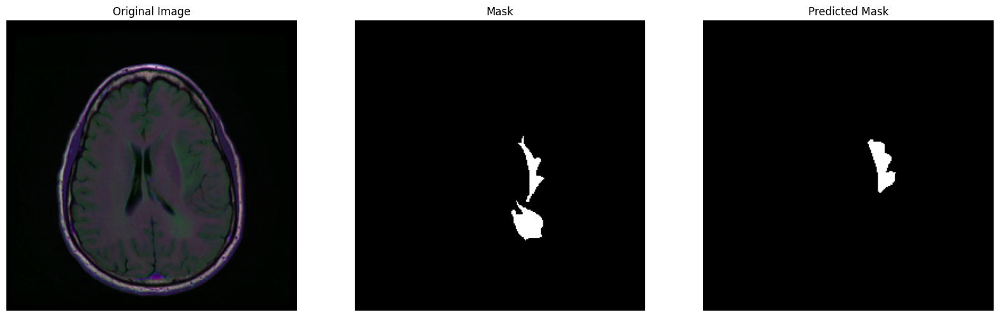

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_12.tif


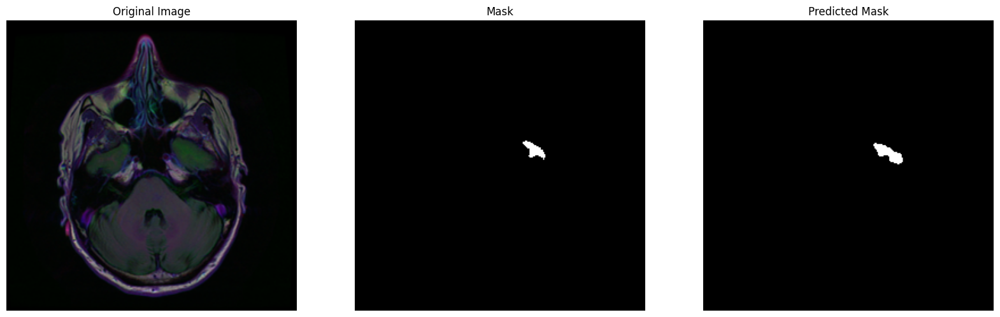

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_14.tif


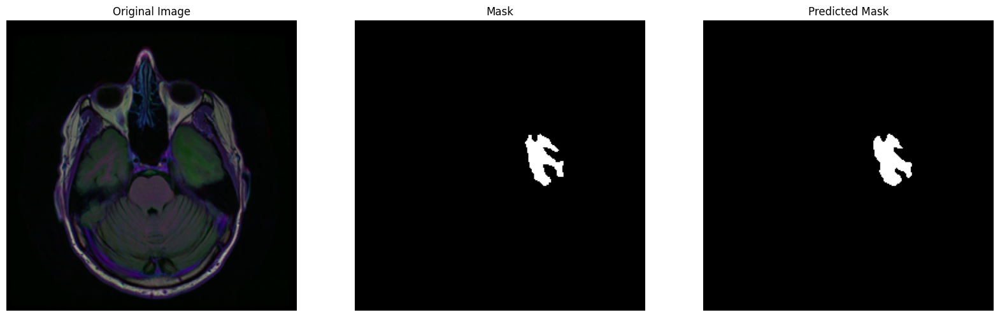

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_22.tif


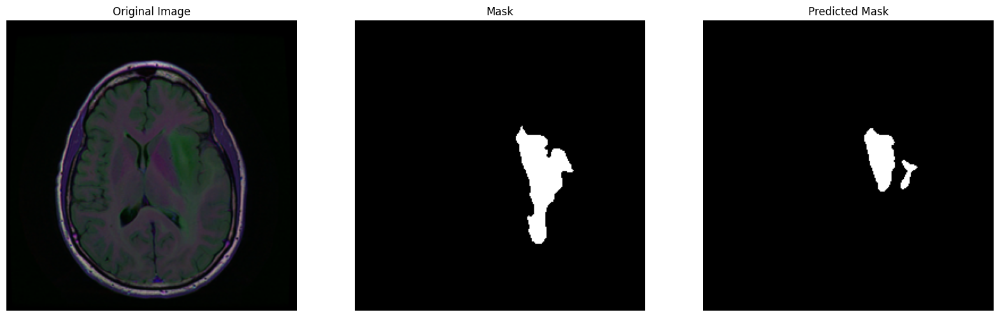

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_20.tif


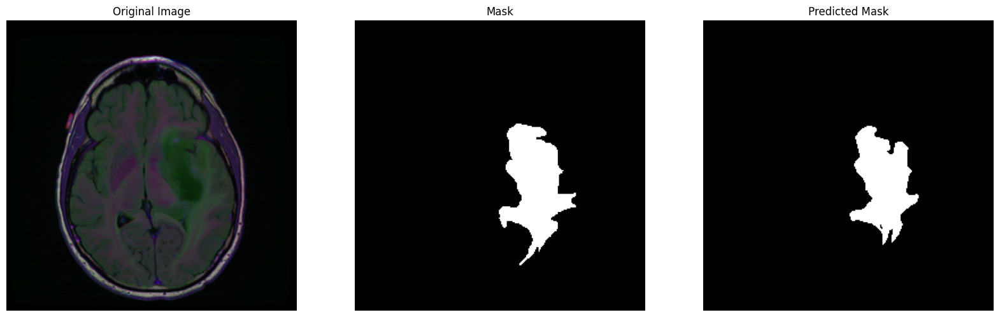

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_23.tif


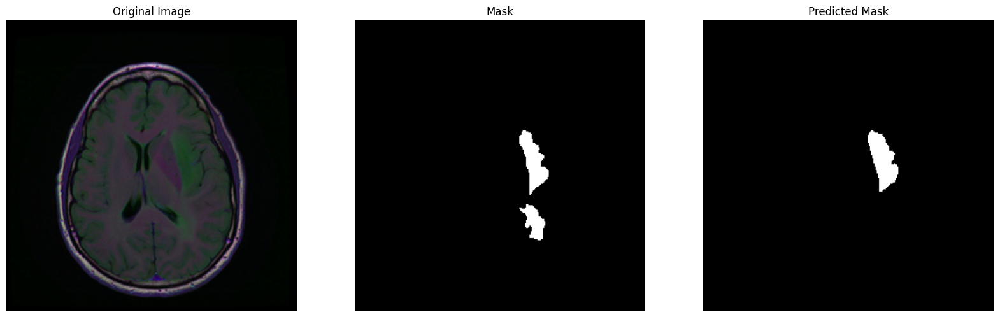

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_A5TR_19970726/TCGA_DU_A5TR_19970726_21.tif


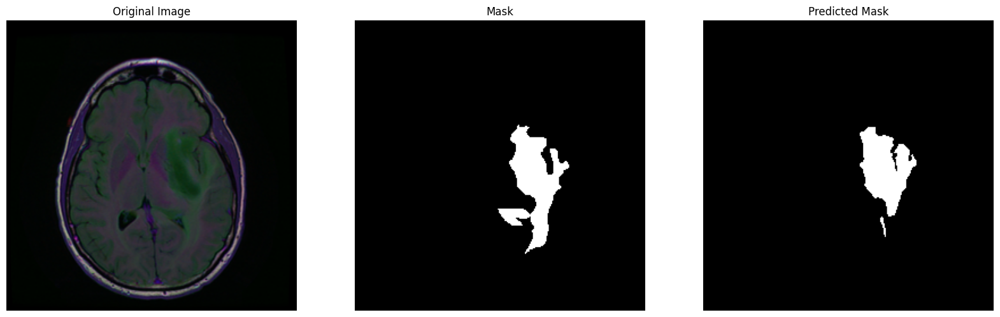

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_18.tif


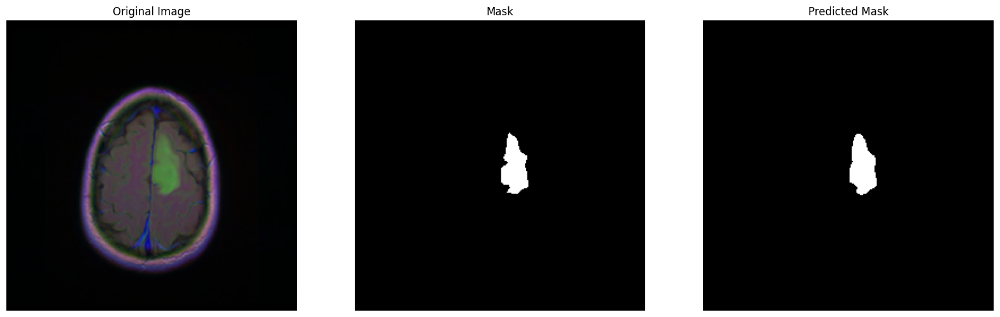

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_15.tif


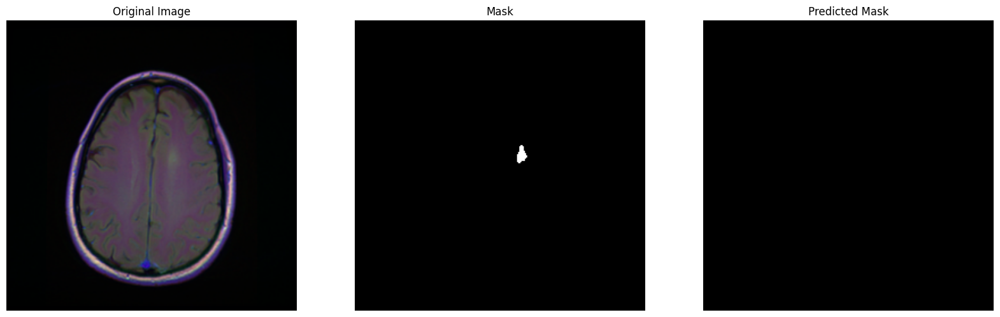

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_16.tif


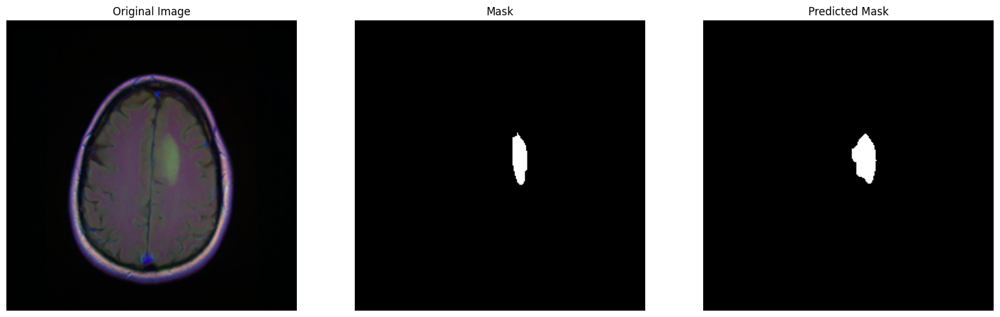

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_20.tif


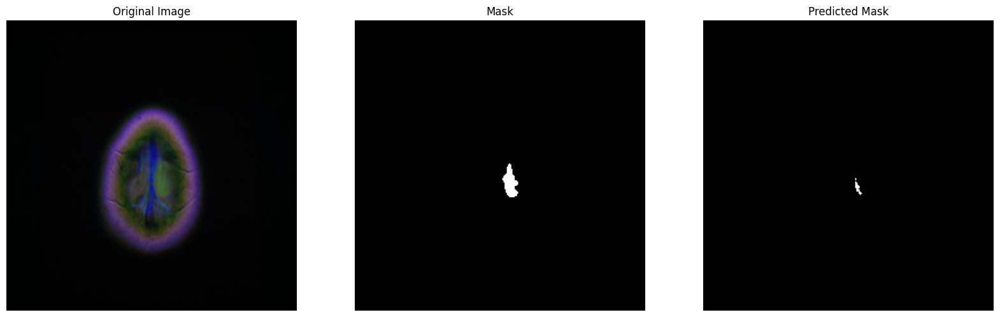

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_17.tif


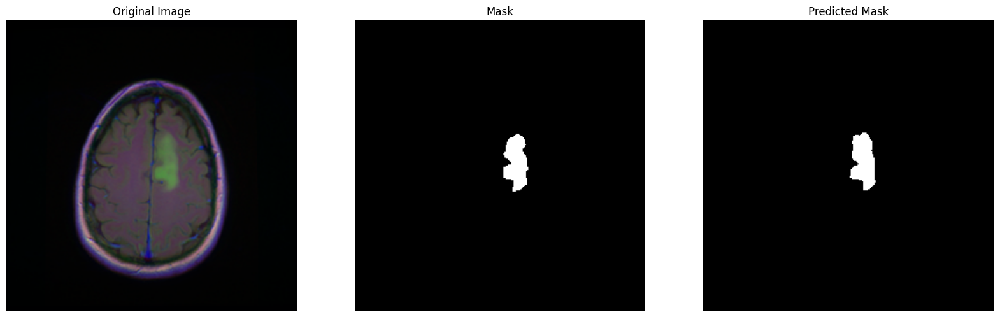

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_7692_19960724/TCGA_HT_7692_19960724_19.tif


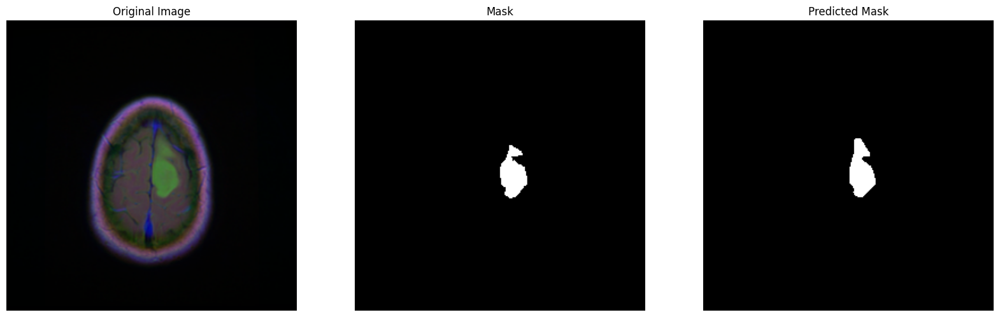

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_19.tif


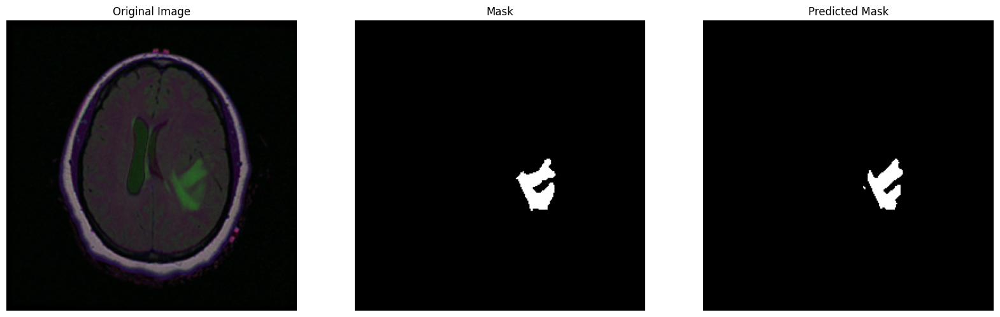

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_11.tif


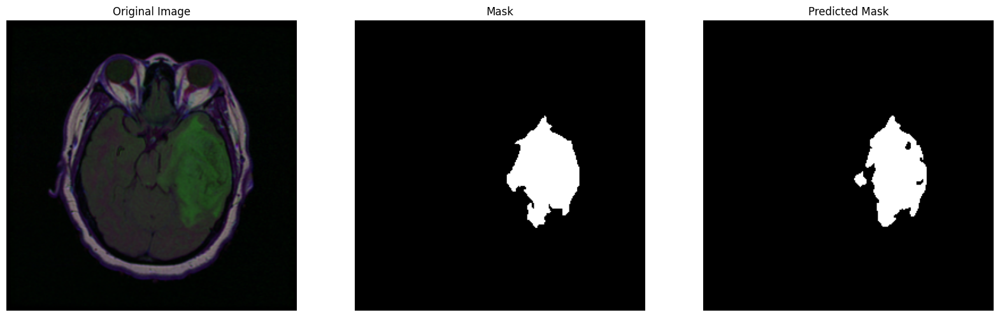

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_10.tif


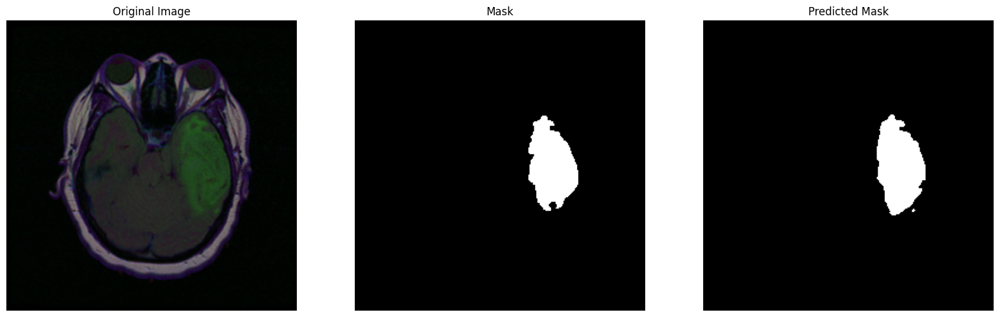

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_14.tif


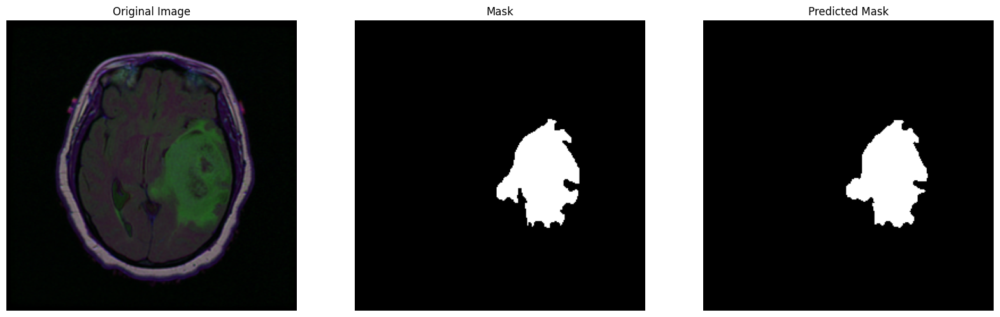

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_13.tif


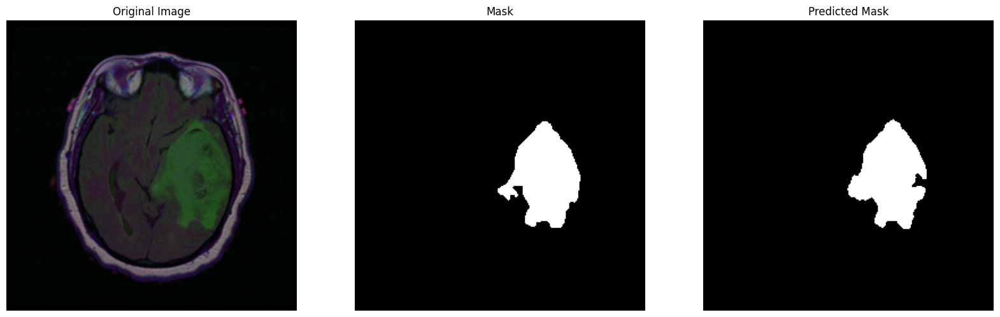

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_17.tif


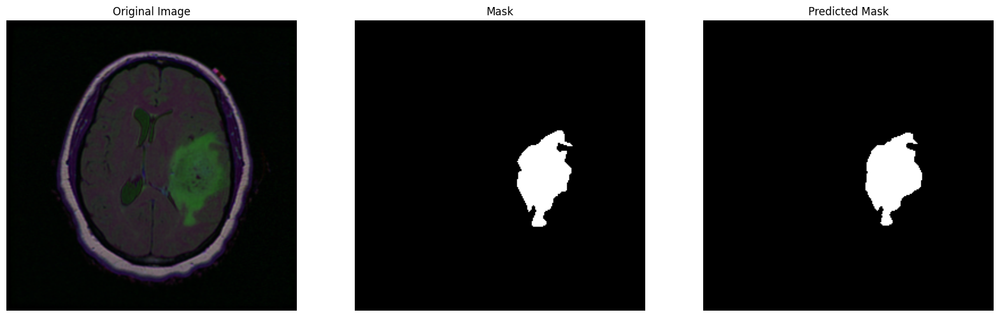

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_12.tif


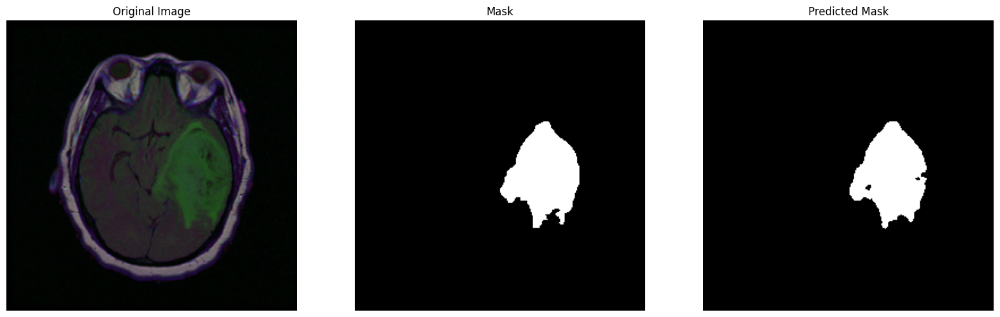

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_15.tif


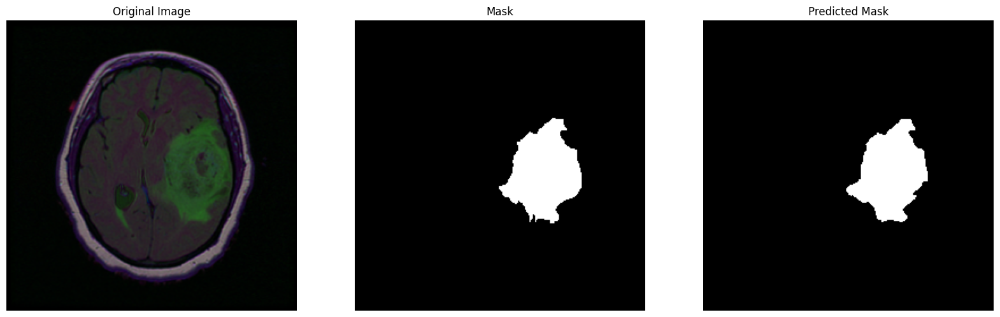

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_18.tif


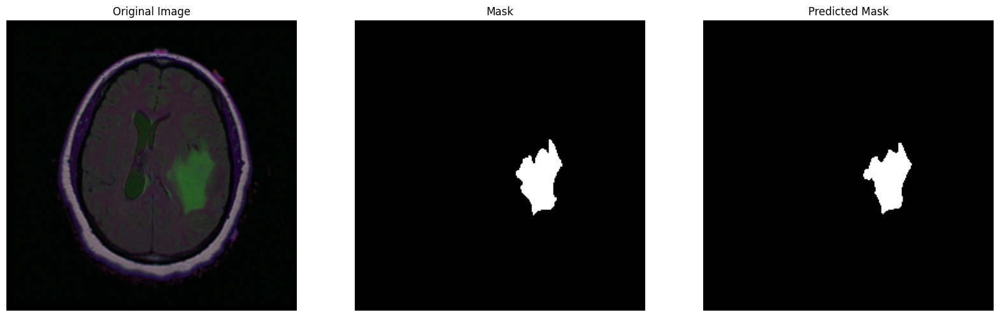

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_8.tif


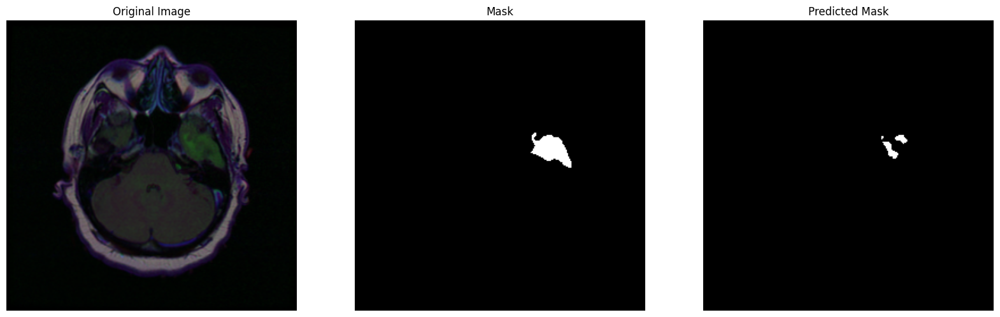

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_20.tif


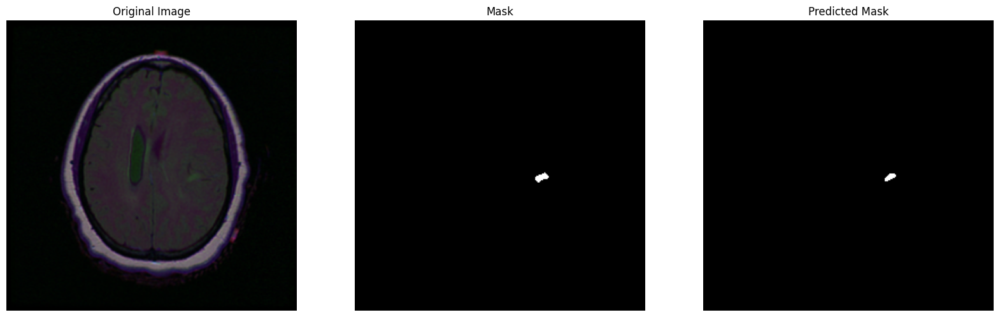

./lgg-mri-segmentation/kaggle_3m/TCGA_DU_7298_19910324/TCGA_DU_7298_19910324_16.tif


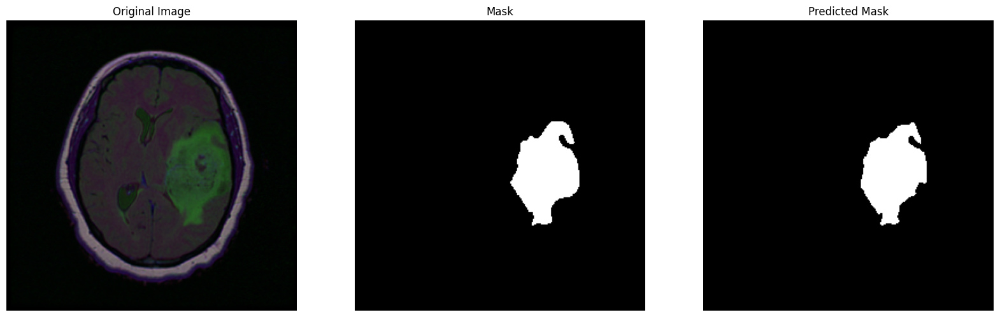

In [ ]:
for image_path, mask_path in zip(tumors["image_path"][:40], tumors["mask_path"][:40]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_6.tif


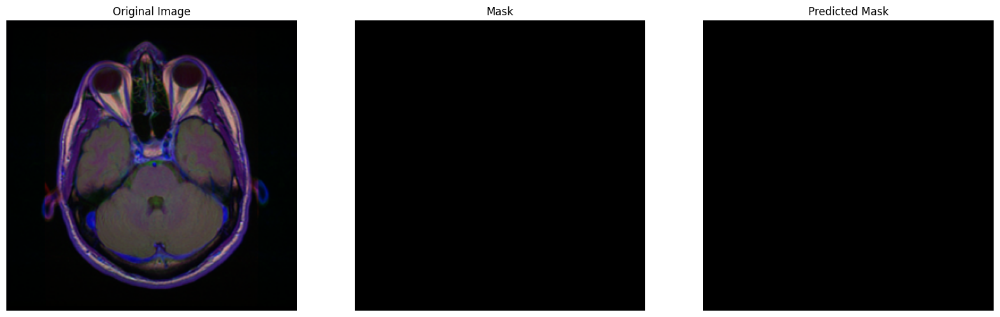

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_11.tif


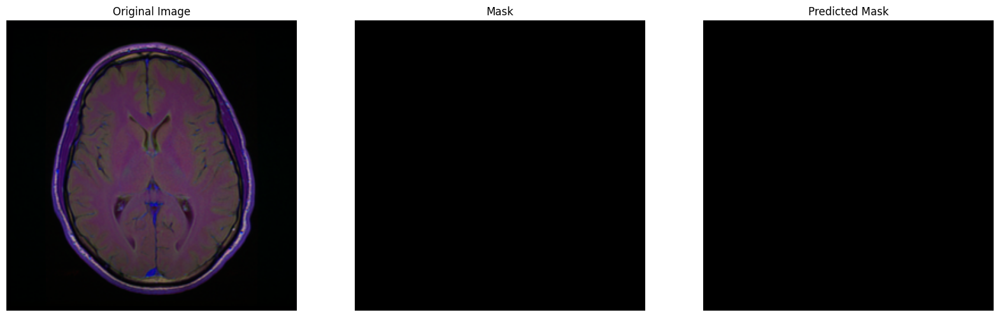

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_10.tif


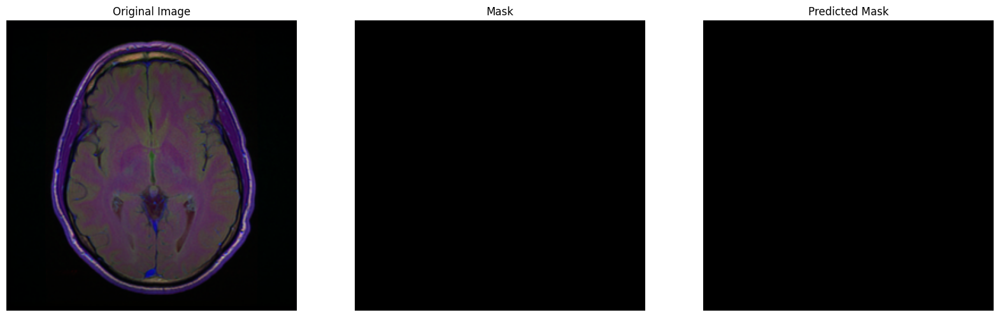

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_3.tif


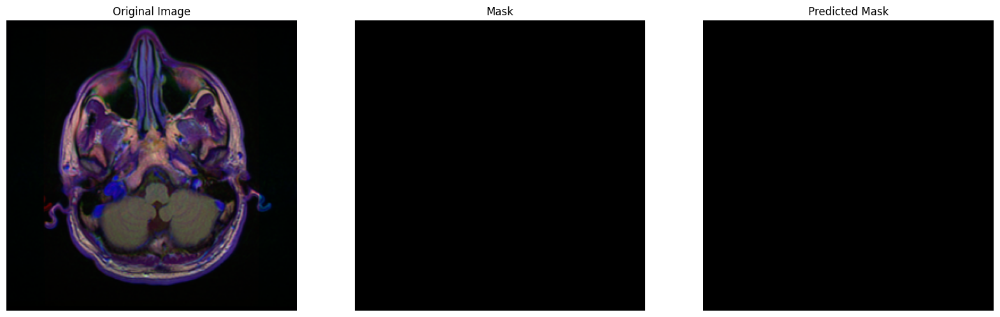

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_8.tif


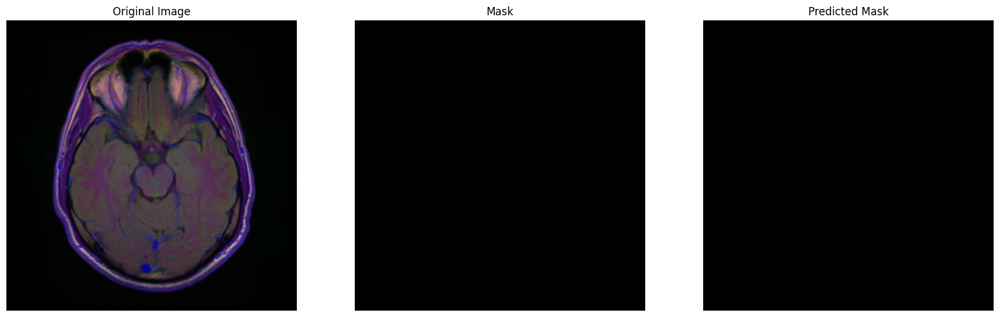

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_21.tif


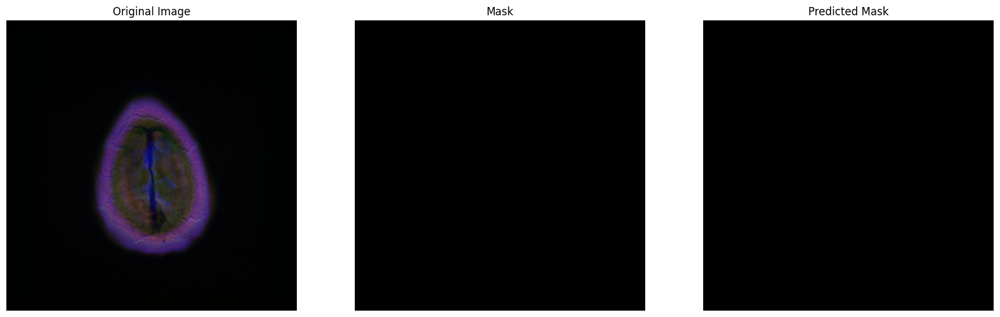

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_9.tif


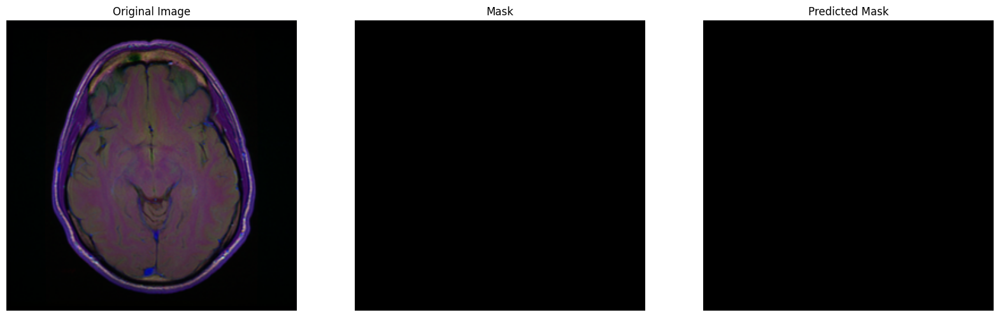

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_7.tif


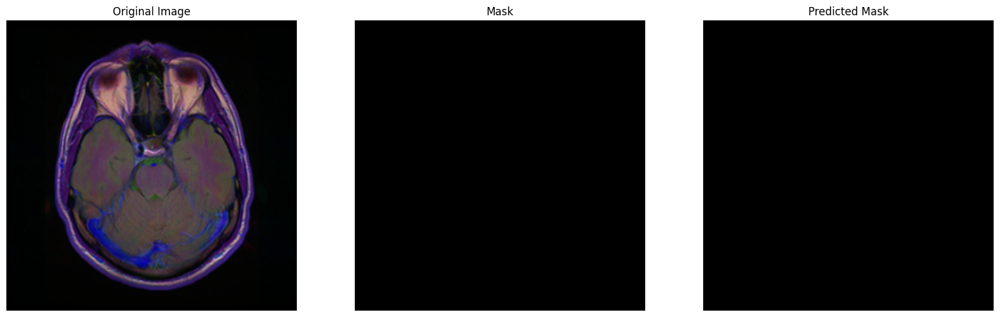

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_2.tif


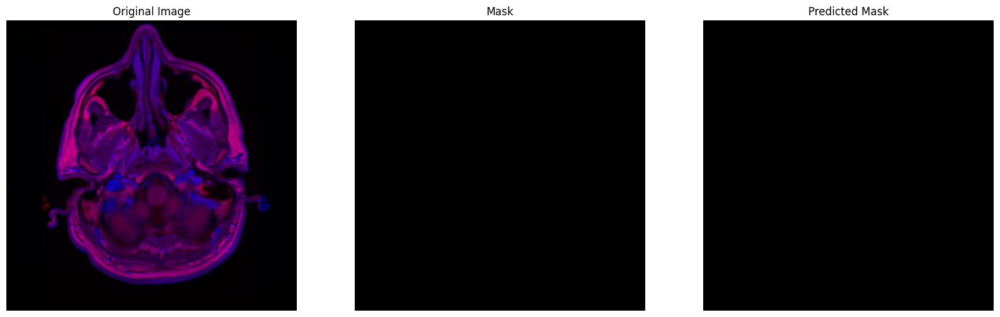

./lgg-mri-segmentation/kaggle_3m/TCGA_HT_8111_19980330/TCGA_HT_8111_19980330_5.tif


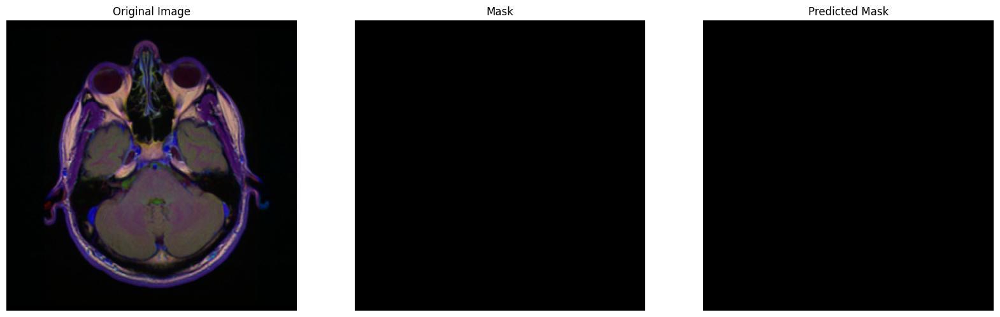

In [ ]:
for image_path, mask_path in zip(no_tumors["image_path"][:10], no_tumors["mask_path"][:10]):
    print(image_path)
    predicted_mask = predict_mask(model, image_path, device)
    image = Image.open(image_path)
    mask = Image.open(mask_path)
    print_res(image, mask, predicted_mask)